# Detect competition
In which we find a likely "winner" and "loser" for each growth word niche by comparing the relative frequency at start and end time.

In [3]:
import pandas as pd
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import sys
if('..' not in sys.path):
    sys.path.append('..')
from data_processing.data_handler import to_series

## Load data

In [6]:
tf = pd.read_csv('../../data/frequency/2015_2016_tf_norm.tsv', sep='\t', index_col=0)
tf_correls = pd.read_csv('../../data/frequency/2015_2016_tf_norm_correls.tsv', sep='\t', index_col=0)
vocab = tf_correls.index.tolist()
tf = tf.loc[vocab]
print(len(vocab))

100000


In [7]:
growth_correl = pd.np.percentile(tf_correls['correl'], 90)
growth_words = tf_correls[tf_correls['correl'] >= growth_correl].index.tolist()
print(growth_correl)
print(len(growth_words))
print(tf_correls.ix[growth_words, 'correl'].sort_values(inplace=False, ascending=False))

0.601398601399
10136
feelsbadman     1.000000
discord         1.000000
af              1.000000
rn              1.000000
downticket      0.993007
tiddies         0.993007
tbf             0.993007
friendo         0.993007
cucked          0.993007
scanlan         0.993007
sanches         0.993007
doggo           0.993007
tbh             0.993007
berners         0.993007
ultraboosts     0.993007
gotchu          0.986014
hote            0.986014
shreds          0.986014
fam             0.986014
str             0.986014
agl             0.986014
lowkey          0.986014
independents    0.986014
ghosted         0.986014
laremy          0.986014
fgo             0.986014
itemless        0.986014
toah            0.986014
dorbz           0.986014
bandai          0.986014
                  ...   
reuleaux        0.601399
ish             0.601399
misspeak        0.601399
spectrum        0.601399
locations       0.601399
ji              0.601399
memetics        0.601399
freeze          0.601399
helm

In [4]:
neighbors_initial = pd.read_csv('../../data/embeddings/2015-06_word2vec_neighbors.tsv', 
                                sep='\t', index_col=0)['2015-06']

In [15]:
neighbors_initial = neighbors_initial.loc[growth_words]
neighbors_initial = neighbors_initial.apply(lambda x: to_series(str(x)).index.tolist())

In [16]:
neighbors_initial.loc['pastafarians']

['apostates',
 'buddhists',
 'christians',
 'heretics',
 'hindus',
 'infidels',
 'jains',
 'kuffar',
 'muslims',
 'pagans']

We're trying to match each growth word $g$ with a word $m_{g}$ (from its set of nearest neighbors $N_{g}$) that $g$ grew the most with respect to, i.e. maximize the ratio of $g$'s final frequency to initial frequency.

For each $g,\: m_{g}=argmax_{n \in N_{g}} (f_{11,g} / f_{11,n}) \: / \: (f_{0,g} / f_{0,n})$.

In [36]:
from datetime import datetime
tf_smooth = 0.1 * tf[tf > 0].min().min()
print(tf_smooth)
tf_smooth = tf + tf_smooth
# restrict to initial/final
tf_smooth_ends = tf_smooth.ix[:, [0,-1]]
growth_pairs = []
all_dates = [datetime.strptime(d, '%Y-%m') for d in sorted(tf.columns)]
for i, v in enumerate(growth_words):
#     print(v)
    neighbors_v = neighbors_initial.loc[v]
    if(len(neighbors_v) > 0):
        # compute difference between initial frequency 
        neighbor_freqs = tf_smooth.loc[neighbors_v]
        v_freq = tf_smooth.loc[v]
        relative_freqs = v_freq / neighbor_freqs
        delta = relative_freqs.ix[:,-1] / relative_freqs.ix[:, 0]
    #     print(delta)
        match = delta.argmax()
    #     print(match)
    #     plt.plot(all_dates, tf_smooth.loc[v], 'b')
    #     plt.plot(all_dates, tf_smooth.loc[match], 'r')
    #     plt.yscale('log')
    #     break
        growth_pairs.append((v, match))
        if(i % 100 == 0):
            print('processed %d words'%(i))

1.06073408559e-10
processed 0 words
processed 100 words
processed 200 words
processed 300 words
processed 400 words
processed 500 words
processed 600 words
processed 700 words
processed 800 words
processed 900 words
processed 1000 words
processed 1100 words
processed 1200 words
processed 1300 words
processed 1400 words
processed 1500 words
processed 1600 words
processed 1700 words
processed 1800 words
processed 1900 words
processed 2000 words
processed 2100 words
processed 2200 words
processed 2300 words
processed 2400 words
processed 2500 words
processed 2600 words
processed 2700 words
processed 2800 words
processed 2900 words
processed 3000 words
processed 3100 words
processed 3200 words
processed 3300 words
processed 3400 words
processed 3500 words
processed 3600 words
processed 3700 words
processed 3800 words
processed 3900 words
processed 4000 words
processed 4100 words
processed 4200 words
processed 4300 words
processed 4400 words
processed 4500 words
processed 4600 words
process

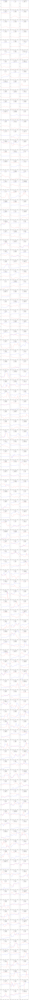

In [50]:
from math import ceil
sample_size = 300
sample_pairs = pd.np.random.choice(range(len(growth_pairs)), size=sample_size, replace=False)
sample_pairs = [p for i, p in enumerate(growth_pairs) if i in sample_pairs]
cols = 3
rows = int(ceil(sample_size / cols)) + 1
size = 4
plt.figure(figsize=(cols * size, rows * size))
all_dates_str = sorted(tf.columns)
dates_abbreve = zip(all_dates, all_dates_str)[::3]
all_dates_abbreve, all_dates_str_abbreve = zip(*dates_abbreve)
for i, (g, m) in enumerate(sample_pairs):
    plt.subplot(rows, cols, i+1)
    plt.plot(all_dates, tf.loc[g], 'b', label=g)
    plt.plot(all_dates, tf.loc[m], 'r', label=m)
    plt.yscale('log')
    plt.legend(loc='upper center')
    plt.xticks(all_dates_abbreve, all_dates_str_abbreve)
plt.tight_layout()
plt.show()

## wang2vec test
Same test but with $wang2vec$ for ~syntactic similarity~.

In [51]:
neighbors_initial = pd.read_csv('../../data/embeddings/2015-06_wang2vec_neighbors.tsv', 
                                sep='\t', index_col=0)['2015-06']
neighbors_initial = neighbors_initial.loc[growth_words]
neighbors_initial = neighbors_initial.apply(lambda x: to_series(str(x)).index.tolist())
print(neighbors_initial.loc['pastafarians'])

['apostates', 'atheists', 'buddhists', 'catholics', 'christians', 'heathens', 'hindus', 'infidels', 'kuffar', 'muslims']


In [52]:
growth_pairs = []
all_dates = [datetime.strptime(d, '%Y-%m') for d in sorted(tf.columns)]
for i, v in enumerate(growth_words):
#     print(v)
    neighbors_v = neighbors_initial.loc[v]
    if(len(neighbors_v) > 0):
        # compute difference between initial frequency 
        neighbor_freqs = tf_smooth.loc[neighbors_v]
        v_freq = tf_smooth.loc[v]
        relative_freqs = v_freq / neighbor_freqs
        delta = relative_freqs.ix[:,-1] / relative_freqs.ix[:, 0]
    #     print(delta)
        match = delta.argmax()
    #     print(match)
    #     plt.plot(all_dates, tf_smooth.loc[v], 'b')
    #     plt.plot(all_dates, tf_smooth.loc[match], 'r')
    #     plt.yscale('log')
    #     break
        growth_pairs.append((v, match))
        if(i % 1000 == 0):
            print('processed %d words'%(i))

processed 0 words
processed 1000 words
processed 2000 words
processed 3000 words
processed 4000 words
processed 5000 words
processed 6000 words
processed 7000 words
processed 8000 words
processed 9000 words
processed 10000 words


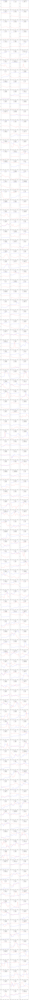

In [53]:
sample_size = 300
# sample_pairs = pd.np.random.choice(range(len(growth_pairs)), size=sample_size, replace=False)
# sample_pairs = [p for i, p in enumerate(growth_pairs) if i in sample_pairs]
# use sample growth words from word2vec
sample_growth_word2vec, _ = zip(*sample_pairs)
sample_pairs = [(g, m) for g,m in growth_pairs if g in sample_growth_word2vec]
cols = 3
rows = int(ceil(sample_size / cols)) + 1
size = 4
plt.figure(figsize=(cols * size, rows * size))
all_dates_str = sorted(tf.columns)
dates_abbreve = zip(all_dates, all_dates_str)[::3]
all_dates_abbreve, all_dates_str_abbreve = zip(*dates_abbreve)
for i, (g, m) in enumerate(sample_pairs):
    plt.subplot(rows, cols, i+1)
    plt.plot(all_dates, tf.loc[g], 'b', label=g)
    plt.plot(all_dates, tf.loc[m], 'r', label=m)
    plt.yscale('log')
    plt.legend(loc='upper center')
    plt.xticks(all_dates_abbreve, all_dates_str_abbreve)
plt.tight_layout()
plt.show()

Seems like $wang2vec$ does better for some words (verbs?):
- `polarize`: `opposing` ($word2vec$) vs. `politicize` ($wang2vec$)
- `protested` : `marched` vs. `rioted`
- `nominees`: `nominations` vs. `justices`
- `boarded` : `shuttled` vs. `capsized`

Shared words:
- `homie`: `brah`
- `communists` : `nazis`
- `bloat` : `crapware`
- `clickbaity` : `sensationalistic`
- `obstructionism` : `intransigence`

Similar words:
- `subversive` : `transgressive` ($word2vec$) vs. `satirical` ($wang2vec$)

## Frequency ratio
Let's try to detect divergence, i.e. where the growth word diverges most dramatically from a neighbor -> neighbor with the lowest final relative to initial frequency.

For each $g,\: m_{g}=argmax_{n \in N_{g}} (f_{0,n} / f_{11,n})$.

In [62]:
neighbors_word2vec = pd.read_csv('../../data/embeddings/2015-06_word2vec_neighbors.tsv', 
                                 sep='\t', index_col=0).ix[:,0]
neighbors_word2vec = neighbors_word2vec.apply(lambda x: to_series(str(x)).index.tolist())
neighbors_wang2vec = pd.read_csv('../../data/embeddings/2015-06_wang2vec_neighbors.tsv', 
                                 sep='\t', index_col=0).ix[:,0]
neighbors_wang2vec = neighbors_wang2vec.apply(lambda x: to_series(str(x)).index.tolist())
# pair each growth word with its matched neighbor
growth_pairs_word2vec = []
growth_pairs_wang2vec = []
for i, v in enumerate(growth_words):
#     print(v)
    try:
        neighbors_word2vec_v = neighbors_word2vec.loc[v]
        neighbors_wang2vec_v = neighbors_wang2vec.loc[v]
        for neighbors_v, pairs in zip([neighbors_word2vec_v, neighbors_wang2vec_v], 
                                      [growth_pairs_word2vec, growth_pairs_wang2vec]):
            if(len(neighbors_v) > 0):
                neighbor_freqs = tf_smooth.loc[neighbors_v]
                delta = neighbor_freqs.ix[:,0] / neighbor_freqs.ix[:, -1]
                match = delta.argmax()
                pairs.append((v, match))
    except Exception, e:
        print('word %s not found'%(v))
        pass
    if(i % 1000 == 0):
        print('processed %d words'%(i))

processed 0 words
processed 1000 words
processed 2000 words
word drumpf not found
word roadhog not found
word glines not found
word zika not found
processed 3000 words
word stellaris not found
word astralis not found
word rashford not found
word nyami not found
word kilgrave not found
word halbach not found
processed 4000 words
word zeruiah not found
word cydney not found
word colborn not found
word anyfin not found
word berniebots not found
word looool not found
word tronald not found
word happypuppy not found
word akechi not found
word suuuuper not found
word ogw not found
processed 5000 words
word latents not found
word orbfest not found
word lmaoooo not found
word yoooo not found
word wismec not found
word carthus not found
word embered not found
word zven not found
word robigo not found
word bradberry not found
word elneny not found
word buting not found
word thesan not found
word saizo not found
word fuchai not found
word bssb not found
word bardugo not found
word moonwater not f

In [63]:
# first plot word2vec, then wang2vec
sample_size = 300
sample_pair_indices = pd.np.random.choice(range(len(growth_pairs_word2vec)), 
                                          size=sample_size, replace=False)
sample_word2vec_pairs = [p for i, p in enumerate(growth_pairs_word2vec) 
                         if i in sample_pair_indices]
sample_wang2vec_pairs = [p for i, p in enumerate(growth_pairs_wang2vec) 
                         if i in sample_pair_indices]

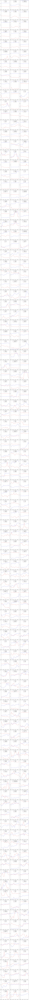

In [65]:
cols = 3
rows = int(ceil(sample_size / cols)) + 1
size = 4
plt.figure(figsize=(cols * size, rows * size))
all_dates_str = sorted(tf.columns)
dates_abbreve = zip(all_dates, all_dates_str)[::3]
all_dates_abbreve, all_dates_str_abbreve = zip(*dates_abbreve)
for i, (g, m) in enumerate(sample_word2vec_pairs):
    plt.subplot(rows, cols, i+1)
    plt.plot(all_dates, tf.loc[g], 'b', label=g)
    plt.plot(all_dates, tf.loc[m], 'r', label=m)
    plt.yscale('log')
    plt.legend(loc='upper center')
    plt.xticks(all_dates_abbreve, all_dates_str_abbreve)
plt.tight_layout()
plt.show()

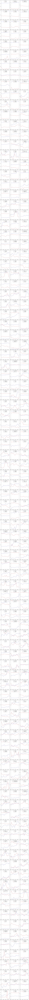

In [66]:
cols = 3
rows = int(ceil(sample_size / cols)) + 1
size = 4
plt.figure(figsize=(cols * size, rows * size))
all_dates_str = sorted(tf.columns)
dates_abbreve = zip(all_dates, all_dates_str)[::3]
all_dates_abbreve, all_dates_str_abbreve = zip(*dates_abbreve)
for i, (g, m) in enumerate(sample_wang2vec_pairs):
    plt.subplot(rows, cols, i+1)
    plt.plot(all_dates, tf.loc[g], 'b', label=g)
    plt.plot(all_dates, tf.loc[m], 'r', label=m)
    plt.yscale('log')
    plt.legend(loc='upper center')
    plt.xticks(all_dates_abbreve, all_dates_str_abbreve)
plt.tight_layout()
plt.show()

This ratio seems to get more unsuccessful competitors, e.g. those that decrease in tandem with the growth words.

Again, some differences based on verbs:

- `genociding` : `enslaving` ($word2vec$) vs. `terrorising` ($wang2vec$)
- `widens` : `squeezes` vs. `flattens`
- `funnels` : `tunnels` vs. `diffuses`
- `pandered` : `placated` vs. `demonized`
- `cutoffs` : `deciles` vs. `percentiles`
- `skits` : `standup` vs. `punchlines`
- `blunder` : `shitstorm` vs. `mishap`

Similarities:
- `xenophobes` : `bigots`
- `trustworthiness` : `trustfulness`
- `condescension` : `prententiousness`
- `handily` : `convincingly`
- `travesty` : `atrocity`

## Granger causality
Try to detect competition between a growth word and its neighbors by measuring the likelihood that the neighbors Granger-influence the word's values.

In [ ]:
# start simple: correlations
from scipy.stats import pearsonr
neighbors_initial = pd.read_csv('../../data/embeddings/2015-06_word2vec_neighbors.tsv', sep='\t', index_col=0).ix[:,0]
neighbors_initial = neighbors_initial.apply(lambda x: to_series(str(x)).index.tolist())

## New word competition
Detect competition between new words based on their relative position in semantic graph. Easy? Haha.

In [104]:
from gensim.models import Word2Vec
word2vec_embeddings = Word2Vec.load_word2vec_format('../../data/embeddings/2015-06_word2vec_embeddings', binary=True)
wang2vec_embeddings = Word2Vec.load_word2vec_format('../../data/embeddings/2015-06_wang2vec_embeddings', binary=True)

In [105]:
word2vec_embeddings = {k : word2vec_embeddings[k] for k,_ in word2vec_embeddings.vocab.iteritems()}
word2vec_embeddings = pd.DataFrame(word2vec_embeddings).transpose()
wang2vec_embeddings = {k : wang2vec_embeddings[k] for k,_ in wang2vec_embeddings.vocab.iteritems()}
wang2vec_embeddings = pd.DataFrame(wang2vec_embeddings).transpose()

In [107]:
from sklearn.metrics.pairwise import cosine_similarity
combined_vocab = set(growth_words) & set(embeddings_raw.index)
word2vec_growth_embeddings = word2vec_embeddings.loc[combined_vocab]
wang2vec_growth_embeddings = wang2vec_embeddings.loc[combined_vocab]
sims_word2vec = cosine_similarity(word2vec_growth_embeddings.values)
sims_wang2vec = cosine_similarity(wang2vec_growth_embeddings.values)
sims_word2vec = pd.DataFrame(sims_word2vec, index=combined_vocab, columns=combined_vocab)
sims_wang2vec = pd.DataFrame(sims_wang2vec, index=combined_vocab, columns=combined_vocab)

In [108]:
print(sims_word2vec.head())
print(sims_wang2vec.head())

              penelo    hordes  mechanicum      foul  unsworth  insiders  \
penelo      1.000000  0.282897    0.275544 -0.027294  0.437758  0.042994   
hordes      0.282897  1.000000    0.404124  0.140361  0.147504  0.162630   
mechanicum  0.275544  0.404124    1.000000  0.040488  0.337239  0.243800   
foul       -0.027294  0.140361    0.040488  1.000000  0.258880  0.014320   
unsworth    0.437758  0.147504    0.337239  0.258880  1.000000  0.286594   

            francesca  sumproduct  counterintelligence  gabrielle    ...     \
penelo       0.470724    0.143296             0.069846   0.248168    ...      
hordes       0.029410    0.013205             0.136393   0.002273    ...      
mechanicum   0.151408    0.136632             0.429635   0.132252    ...      
foul         0.173323    0.052331             0.184853   0.137459    ...      
unsworth     0.522890    0.163654             0.316433   0.476605    ...      

            alienated   weiland     xenos   pierson  richburg   volu

In [109]:
import networkx as nx
G_word2vec = nx.Graph()
G_wang2vec = nx.Graph()
top_k = 10
sims_G = zip([sims_word2vec, sims_wang2vec], [G_word2vec, G_wang2vec])
for v in combined_vocab:
    # get nearest neighbors among growth words
    for sims, G in sims_G:
        neighbors_v = sims.loc[v].sort_values(inplace=False, ascending=False)[1:top_k+1]
        for n, w in zip(neighbors_v.index, neighbors_v.values):
            G.add_edge(v, n, weight=w)

In [111]:
embed_names = ['word2vec', 'wang2vec']
for embed_name, G in zip(embed_names, [G_word2vec, G_wang2vec]):
    print(embed_name)
    degree = pd.Series(G.degree())
    degree.sort_values(inplace=True, ascending=False)
    print(degree)

word2vec
zellner             179
aubry                93
wewlad               90
kazuichi             88
mukuro               86
groff                75
gabbard              75
luminara             72
winstead             72
togami               71
oyeyemi              71
vrei                 70
leftist              69
staveley             68
terminar             67
franta               65
riko                 64
webui                63
hiyori               62
quetz                61
mccaffery            60
upshall              60
republican           60
pensalir             60
poti                 60
maggie               59
ichigo               59
ciudades             58
fascism              57
geraldine            56
                   ... 
searchers            10
unearthed            10
seated               10
seconding            10
undoes               10
iota                 10
involvements         10
undid                10
underwood            10
underutilized        10
compens

As expected, the overly specific words have lower degree and the more general and foreign (overfit) words have higher degree.

In [112]:
components_word2vec = list(nx.connected_components(G_word2vec))
print(len(components_word2vec))
giant = max(components_word2vec, key=len)
print(len(giant))
components_wang2vec = list(nx.connected_components(G_wang2vec))
print(len(components_wang2vec))
giant = max(components_wang2vec, key=len)
print(len(giant))

1
9904
1
9904


So it made a giant component, that's cool. How to deal with it?

We can just partition it randomly into 80% train and 20% test, then pair off words in each while hoping that there's enough competition to go around.

In [161]:
def sample_G_edges(sims, G_edges):
    G_sample = nx.Graph()
    sample_nodes = set()
    n0 = pd.np.random.choice(sims.index.tolist(), 1)[0]
    while(G_sample.number_of_edges() < G_edges):
        try:
            neighbors = sims.loc[n0].sort_values(inplace=False, ascending=False)[1:].index.tolist()
            neighbors = [x for x in neighbors if x not in sample_nodes]
            n1 = neighbors[0]
            weight = sims.ix[n0, n1]
            G_sample.add_edge(n0, n1, weight=weight)
            sample_nodes.update(set([n0, n1]))
            n0 = neighbors[1]
        except Exception, e:
            print('broke because %s'%(e))
            break
    return G_sample

In [157]:
# sample pairs (based on nearest-neighbor) until training set achieved
training_pct = .8
N = int(G_word2vec.number_of_nodes() / 2)
training_size = int(.8 * N)
test_size = N - training_size
G_copy = G_word2vec.copy()
all_nodes = G_word2vec.nodes()
# first partition graph into training and test!
train_G = nx.Graph()
n0 = pd.np.random.choice(all_nodes, 1)[0]
train_queue = []
train_queue.append(n0)
train_sims = sims.copy()
G_train = sample_G_edges(sims, training_size)

In [159]:
print(G_train.number_of_edges())
print(training_size)

3961
3961


In [163]:
test_nodes = set(sims.index.tolist()) - set(G_train.nodes())
print(len(test_nodes))
sims_test = sims.ix[test_nodes, test_nodes]
G_test = sample_G_edges(sims_test, test_size)

1982
broke because list index out of range


In [164]:
print(G_test.number_of_edges())
print(test_size)

991
991


In [167]:
## print sample of train and test edges
print('train pairs: %s'%(G_train.edges()[:20]))
print('test pairs: %s'%(G_test.edges()[:20]))

train pairs: [('penelo', 'hanamura'), ('hordes', 'hoards'), ('mechanicum', 'imperium'), ('foul', 'fouling'), ('showa', 'millenium'), ('unsworth', 'mauss'), ('francesca', 'sophie'), ('sumproduct', 'factorial'), ('counterintelligence', 'investigative'), ('gabrielle', 'emma'), ('satisfyingly', 'weirdly'), ('shura', 'sabbat'), ('voorzitter', 'mlem'), ('scola', 'foye'), ('uldaman', 'quetz'), ('ciudades', 'pasan'), ('headcanon', 'headcannon'), ('lori', 'meredith'), ('isshin', 'renji'), ('rickman', 'eisenberg')]
test pairs: [('criminally', 'disastrously'), ('dynamic', 'mirroring'), ('whose', 'brightest'), ('gamut', 'parallels'), ('eligible', 'ineligible'), ('agitator', 'galvanizing'), ('stationery', 'bouquets'), ('favours', 'favors'), ('digit', 'digits'), ('regional', 'national'), ('connects', 'surrounds'), ('moonlights', 'bona'), ('fragmenting', 'deploying'), ('quiting', 'finishing'), ('funneled', 'funnels'), ('micromanage', 'retrain'), ('whish', 'afterglow'), ('cmf', 'foils'), ('debunked', 

OK, some of these are good (`hordes`, `hoards`; `regional`, `national`) but others are questionable (`eligible`, `ineligible`; `digit`, `digits`; `dynamic`, `mirroring`).

Can we predict success of one word over another??

Formally:

for each pair of words $w_1$ and $w_2$, predict the "winner" at time $t_{11}$ based on relative frequency $f$, diffusion $D_{U}$ $D_{T}$ $D_{S}$, context diversity $C_{2}$ (2=bigram), and approximate polysemy $P$ at $t_{0}$.

In [237]:
# for each word pair, get binary relative stats at t_0
user_diffusion = pd.read_csv('../../data/frequency/2015_2016_user_diffusion.tsv', sep='\t', index_col=0).ix[:,0]
sub_diffusion = pd.read_csv('../../data/frequency/2015_2016_subreddit_diffusion.tsv', sep='\t', index_col=0).ix[:,0]
thread_diffusion = pd.read_csv('../../data/frequency/2015_2016_thread_diffusion.tsv', sep='\t', index_col=0).ix[:,0]
bigram_resids = pd.read_csv('../../data/frequency/2015_2016_2gram_resids.tsv', sep='\t', index_col=0).ix[:,0]
niche_mean = pd.read_csv('../../data/embeddings/2015_2016_wang2vec_top_10_sim_niche_similarities.tsv', 
                        sep='\t', index_col=0).ix[:, 0]
niche_var = pd.read_csv('../../data/embeddings/2015_2016_wang2vec_top_10_var_niche_similarities.tsv', 
                        sep='\t', index_col=0).ix[:, 0]
niche_mean = pd.np.log10(niche_mean)
niche_var = pd.np.log10(niche_var)

In [230]:
all_stats = pd.concat([tf.ix[:,0], user_diffusion, 
                       sub_diffusion, thread_diffusion, 
                       bigram_resids, niche_mean, niche_var], 
                      axis=1)
stat_names = ['tf', 'D_U', 'D_S', 'D_T', '2gram_resid', 'N_mean', 'N_var']
all_stats.columns = stat_names
def build_data(pairs, all_stats):
    data = []
    names = []
    for pair in pairs:
        w1, w2 = pair
        sample = []
        for stat_name in stat_names:
            if('resid' in stat_name):
                s = all_stats.ix[w1, stat_name] - all_stats.ix[w2, stat_name]
            else:
                s = all_stats.ix[w1, stat_name] / all_stats.ix[w2, stat_name]
            sample.append(s)
        sample = pd.Series(sample, index=stat_names)
        sample.fillna(0, inplace=True)
        sample.replace(pd.np.inf, 0, inplace=True)
        data.append(sample)
        name = '%s_%s'%(w1, w2)
        names.append(name)
    data = pd.concat(data, axis=1).transpose()
    data.index = names
    return data
X_train = build_data(G_train.edges_iter(), all_stats)
X_test = build_data(G_test.edges_iter(), all_stats)

In [231]:
print(X_train.head())

                            tf       D_U       D_S       D_T  2gram_resid  \
penelo_hanamura       2.652174  1.036435  0.882719  0.776815  -716.253970   
hordes_hoards         5.202977  0.889234  0.691857  0.869524  -538.535194   
mechanicum_imperium   0.050725  1.080002  0.762228  1.163225  1802.467174   
foul_fouling         18.811215  0.792832  1.441149  0.730727  -305.271441   
showa_millenium       0.199785  0.636194  0.476244  0.642161  1041.623921   

                       N_mean     N_var  
penelo_hanamura      1.003844  1.365101  
hordes_hoards        1.166547  0.403807  
mechanicum_imperium  0.997658  1.526245  
foul_fouling         1.070468  0.563811  
showa_millenium      1.058872  0.576588  


In [232]:
# prepare Y
train_pairs = list(map(lambda x: x.split('_'), X_train.index.tolist()))
test_pairs = list(map(lambda x: x.split('_'), X_test.index.tolist()))
train_w1, train_w2 = zip(*train_pairs)
test_w1, test_w2 = zip(*test_pairs)
Y_train = pd.Series(((tf.ix[train_w1, -1].values / tf.ix[train_w2, -1].values) > 1.).astype(int), index=X_train.index)
Y_test = pd.Series(((tf.ix[test_w1, -1].values / tf.ix[test_w2, -1].values) > 1.).astype(int), index=X_test.index)

In [233]:
print(Y_train.head())
print(Y_train.mean())
print(Y_test.head())
print(Y_test.mean())

penelo_hanamura        0
hordes_hoards          1
mechanicum_imperium    0
foul_fouling           1
showa_millenium        0
dtype: int64
0.485988386771
criminally_disastrously    1
dynamic_mirroring          1
whose_brightest            1
gamut_parallels            0
eligible_ineligible        1
dtype: int64
0.518668012109


Approximately class-balanced?

In [235]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
lr = LogisticRegression()
stat_combos = [['tf'], 
               ['tf', 'D_U', 'D_S', 'D_T'], 
               ['tf', '2gram_resid', 'N_mean', 'N_var'], 
               ['tf', 'D_U', 'D_S', 'D_T', '2gram_resid', 'N_mean', 'N_var']]
for stat_combo in stat_combos:
    print('testing combo %s'%(','.join(stat_combo)))
    X_train_ = X_train[stat_combo]
    X_test_ = X_test[stat_combo]
    lr.fit(X_train_, Y_train)
    Y_pred = lr.predict_proba(X_test_)[:, 1]
    auc = roc_auc_score(Y_test, Y_pred) * 100
    print('AUC=%.3f'%(auc))

testing combo tf
AUC=96.156
testing combo tf,D_U,D_S,D_T
AUC=96.243
testing combo tf,2gram_resid,N_mean,N_var
AUC=95.707
testing combo tf,D_U,D_S,D_T,2gram_resid,N_mean,N_var
AUC=96.007


OK. Looks like the task isn't that hard, but social diffusion helps only marginally and semantic diversity doesn't help at all.

In [236]:
from statsmodels.discrete.discrete_model import Logit
# combine data
Y_combined = pd.concat([Y_train, Y_test], axis=0)
X_combined = pd.concat([X_train, X_test], axis=0)
logit = Logit(Y_combined, X_combined)
results = logit.fit()
print(results.summary())

Optimization terminated successfully.
         Current function value: 0.406781
         Iterations 14
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 4952
Model:                          Logit   Df Residuals:                     4945
Method:                           MLE   Df Model:                            6
Date:                Sat, 25 Mar 2017   Pseudo R-squ.:                  0.4130
Time:                        18:15:58   Log-Likelihood:                -2014.4
converged:                       True   LL-Null:                       -3431.9
                                        LLR p-value:                     0.000
                  coef    std err          z      P>|z|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
tf              1.3337      0.052     25.756      0.000         1.232     1.435
D_U            -0.2954   

Positive correlation with $f$ is clear: winning words tend to stay on top. $D_{T}$ has strongest negative effect of all predictive variables; the rest are mostly noise. Does this mean that overly-diffuse words end up losing?